In [1]:
library(Seurat)
library(data.table)
library(stringr)
library(ggplot2)
library(patchwork)
library(dplyr)

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built with package ‘Matrix’ 1.6.5 but the current
version is 1.7.1; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [2]:
fn = function(p, no.legend=T) {
    lx = unlist(lapply(p$patches$plots, function(x) {ggplot_build(x)$layout$panel_scales_x[[1]]$range$range}))
    ly = unlist(lapply(p$patches$plots, function(x) {ggplot_build(x)$layout$panel_scales_y[[1]]$range$range}))
    p = p & theme(panel.grid=element_line(colour="grey", size=0.5)) & xlim(min(lx), max(lx)) & ylim(min(ly), max(ly)) 
    if (no.legend) p = p & NoLegend()
    return(p)
}

In [4]:
mkdirs <- function(directory_path) {
  if (!dir.exists(directory_path)) {
    dir.create(directory_path, showWarnings = FALSE, recursive = TRUE)
    message("Directory created: ", directory_path)
  } else {
    message("Directory already exists: ", directory_path)
  }
}

In [3]:
path2root = "/home/xinyuelu/AD-proj/results"
path2datadir = file.path(path2root, 'results', 'merged_data')
path2metadir = file.path(path2root, 'results', 'hPFC-lib-all') 
path2figdir = file.path(path2root, 'figures-annotate-hPFC', 'annotation')
path2resdir = file.path(path2root, 'results-annotate-hPFC', 'annotation')

In [5]:
mkdirs(path2figdir)
mkdirs(path2resdir)

Directory created: /home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation

Directory already exists: /home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation



In [6]:
options(future.globals.maxSize = 2e11)

# Load GAGE-seq

### Load RNA expression in 10x output

In [11]:
lib_name <- "hPFC-lib-all"
species <- "human"
genome <- "hg38"

In [12]:
data_dir <- file.path(path2datadir, 
                paste0("RNA_", lib_name, "_10x"))
matrix_file <- file.path(data_dir, "matrix.mtx")
features_file <- file.path(data_dir, "genes.tsv")
barcodes_file <- file.path(data_dir, "barcodes.tsv")

matrix <- Matrix::readMM(matrix_file)  
features <- read.delim(features_file, header = FALSE, stringsAsFactors = FALSE)
barcodes <- read.delim(barcodes_file, header = FALSE, stringsAsFactors = FALSE)

In [13]:
rownames(matrix) <- make.unique(features$V2)
colnames(matrix) <- barcodes$V1  

In [14]:
obj.gage <- CreateSeuratObject(counts = matrix, project = lib_name, min.cells = 10)
df_meta = read.csv(
    file.path(path2metadir, 
    paste0("meta_", lib_name, "_", species, "_", genome, ".csv")), 
    header = TRUE, row.name = 1, sep = ",",
)
print(dim(df_meta))
stopifnot(all.equal(colnames(obj.gage), rownames(df_meta)))
obj.gage = AddMetaData(obj.gage, df_meta)
obj.gage = AddMetaData(obj.gage, metadata='GAGE-seq', col.name='dataset')
obj.gage = AddMetaData(obj.gage, metadata=obj.gage$batch, col.name='dataset2')
obj.gage

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Data is of class dgTMatrix. Coercing to dgCMatrix.”


[1] 30557   201


An object of class Seurat 
43229 features across 30557 samples within 1 assay 
Active assay: RNA (43229 features, 0 variable features)
 1 layer present: counts

### Remove doublets

In [15]:
df <- read.csv(file.path(path2resdir, 'doublet', paste0('doublet_', lib_name,'_complete_', genome,'_filtered.csv')), row.names=1)
df <- df['X1e.07_0.70']
colnames(df) <- c('doublet')
obj.gage[['doublet']] <- df
obj.gage = subset(obj.gage, subset=doublet == 0)
obj.gage

An object of class Seurat 
43229 features across 27365 samples within 1 assay 
Active assay: RNA (43229 features, 0 variable features)
 1 layer present: counts

## Data preprocessing

In [28]:
path2tmpfigdir <- file.path(path2figdir, "preprocess")
path2tmpresdir <- file.path(path2resdir, "preprocess")
mkdirs(path2tmpfigdir)
mkdirs(path2tmpresdir)

Directory already exists: /home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/preprocess

Directory created: /home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/preprocess



In [16]:
DefaultAssay(obj.gage) <- "RNA"
obj.gage <- NormalizeData(obj.gage, verbose=F)
obj.gage <- FindVariableFeatures(obj.gage, verbose=F)
obj.gage <- ScaleData(obj.gage, verbose=F)
obj.gage <- RunPCA(obj.gage, verbose=F, npcs = 50)

In [18]:
w = 12
h = 8
saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- FeatureScatter(obj.gage, feature1 = "nCount_RNA", feature2 = "nFeature_RNA") +
    theme_classic()
path2file <- file.path(path2tmpfigdir, "RNA_feature_scatter_pearson_wo_doublets.png")
ggsave(path2file, p, width=w, height=h)
options(saved)

In [ ]:
num_pcs = 50
print(Sys.time())
obj.gage <- JackStraw(obj.gage, num.replicate = 100, dims=num_pcs)
print(Sys.time())
obj.gage <- ScoreJackStraw(obj.gage, dims = 1:num_pcs)
print(Sys.time())

In [ ]:
saved <- options(repr.plot.width=20, repr.plot.height=8)
JackStrawPlot(obj.gage, dims = 1:num_pcs)
options(saved)

In [19]:
obj <- obj.gage

num_pcs = 45
num_nbrs = 15
obj <- FindNeighbors(
        obj, dims=1:num_pcs, k.param=num_nbrs, verbose=F,
        annoy.metric='euclidean'
    )
obj <- FindClusters(obj, resolution=3, n.start=100, n.iter=100, verbose=F)
obj[['raw.ident']] <- Idents(obj)

obj <- RunUMAP(obj, verbose=F, dims=1:num_pcs, min.dist=.2, n.neighbors=num_nbrs, metric='euclidean')

obj.gage <- obj

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [20]:
w = 25
h = 12
saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- DimPlot(obj, label=F, repel=T, label.size=5, group.by='batch') +
DimPlot(obj, label=F, repel=T, label.size=5, group.by='condition') +
DimPlot(obj, label=F, repel=T, label.size=5, group.by='sex') +
DimPlot(obj, label=F, repel=T, label.size=5, group.by='sample_id') +
DimPlot(obj, label=T, repel=T, label.size=5)
path2file <- file.path(path2tmpfigdir, "UMAP_RNA-Seurat-wodoublets.png")
ggsave(path2file, p, width=w, height=h)
options(saved)

In [23]:
w = 18
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)
p1 <- DimPlot(subset(obj, subset = condition == "AD"), label=T, repel=T, label.size=5) +
      ggtitle("AD raw clusters") 
p2 <- DimPlot(subset(obj, subset = condition == "CT"), label=T, repel=T, label.size=5) +
      ggtitle("CT raw clusters") 
p <- p1 | p2
path2file <- file.path(path2tmpfigdir, "UMAP_RNA-Seurat-wodoublets_AD-vs-CT.png")
ggsave(path2file, p, width=w, height=h)
options(saved)

In [30]:
df <- obj.gage[[]]
df_cond <- table(df[c('raw.ident', 'condition')])
write.csv(df_cond, file.path(path2tmpresdir, "RNA_raw_idents_table.csv"))

### Differences in AD/CT
+ Clusters 21,40,41,46 are clusters of cells that belongs to AD but (almost) not seen in CT
+ Clusters 37,43,44,45 are clusters of cells that belongs to CT but (almost) not seen in AD

[1] "/home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/preprocess/PCA_RNA-Seurat_hPFC-lib-all_complete_hg38_filtered.csv"


[1] "/home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/preprocess/UMAP_RNA-Seurat_hPFC-lib-all_complete_hg38_filtered.csv"
[1] "/home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/preprocess/meta-Seurat-raw_hPFC-lib-all_complete_hg38_filtered.csv"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/preprocess/coverage-raw_RNA-Seurat_hPFC-lib-all_complete_hg38_filtered.png"


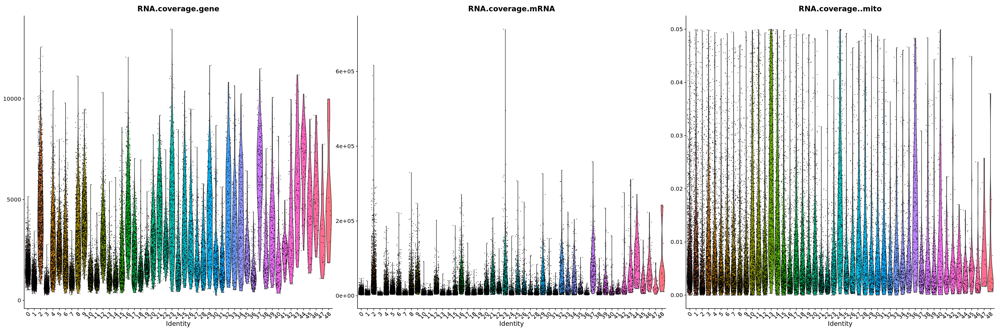

In [32]:
path2file = file.path(path2tmpresdir, paste0("PCA_RNA-Seurat_", lib_name,"_complete_hg38_filtered.csv"))
print(path2file)
write.csv(data.frame(obj[["pca"]]@cell.embeddings), path2file)

path2file = file.path(path2tmpresdir, paste0("UMAP_RNA-Seurat_", lib_name, "_complete_hg38_filtered.csv"))
print(path2file)
write.csv(data.frame(obj[["umap"]]@cell.embeddings), path2file)

path2file = file.path(path2tmpresdir, paste0("meta-Seurat-raw_", lib_name, "_complete_hg38_filtered.csv"))
print(path2file)
write.csv(data.frame(Idents(obj)), path2file)

w = 30
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)                      
p <- VlnPlot(obj, c('RNA.coverage.gene', 'RNA.coverage.mRNA', 'RNA.coverage..mito'))
print(p)                  
path2file = file.path(path2tmpfigdir, paste0("coverage-raw_RNA-Seurat_", lib_name, "_complete_hg38_filtered.png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)
options(saved)   

## Annotate Cell Types

In [41]:
path2tmpfigdir <- file.path(path2figdir, "marker_genes")
path2tmpresdir <- file.path(path2resdir, "marker_genes")
mkdirs(path2tmpfigdir)
mkdirs(path2tmpresdir)

Directory already exists: /home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes

Directory already exists: /home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/marker_genes



In [66]:
plot_markers = function(obj, features, title, width=12, height=8, sort_order = NULL) {
    if (!is.null(sort_order)) {
        Idents(obj) <- factor(Idents(obj), levels = sort_order)
    }
    p <- DotPlot(obj, features=features) + ggtitle(title) + 
    theme_classic() + 
    theme(plot.title = element_text(size = 12)) + 
    theme(axis.text.x = element_text(size = 12, angle = 45, hjust = 1))
    p <- p + scale_color_distiller(palette = "RdBu")
    print(p)
    for (suffix in c('png', 'pdf')) {
        path2file = file.path(path2tmpfigdir, paste0('markergene-dot-', title, '.', suffix))
        print(path2file)
        ggsave(path2file, p, width=width, height=height, dpi=500)
    }
}

## Annotate Major cell types

In [60]:
path2tmpfigdir <- file.path(path2figdir, "marker_genes", "major_cell_type")
path2tmpresdir <- file.path(path2resdir, "marker_genes", "major_cell_type")
mkdirs(path2tmpfigdir)
mkdirs(path2tmpresdir)

Directory already exists: /home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type

Directory already exists: /home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/marker_genes/major_cell_type



### Marker gene annotation

In [67]:
genes.major = c(
    "NRGN", "SYT1", "SNAP25", "GRIN1", "SLC17A7", "CAMK2A", "CBLN2", # Exc
    "GAD1", "GAD2", "DPP10", "RELN", # Inh
    "AQP4", "GFAP", "GPC5", "SLC1A2", "ADGRV1", "SLC1A3",# Astro
    "MBP", "MOBP", "PLP1", "ST18", "LINC00609", "OSP", "MOG", "CNP", # Oligo
    "CSF1R", "CD74", "C3", "SRGN", "HS3ST4", "LRMDA", "F13A1", # Micro
    "VCAN", "PDZRN4", "CSPG4", # OPC
    "TSHZ2", "ADAMTS9", "ABCB1","FLT1", "CLDN5",  # Endo
    "COL1A1", "COL1A2", "COLEC12" # VLMC
)


Warning message:
“The following requested variables were not found: OSP”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/markergene-dot-major-cell-types-raw_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/markergene-dot-major-cell-types-raw_hPFC-lib-all.pdf"


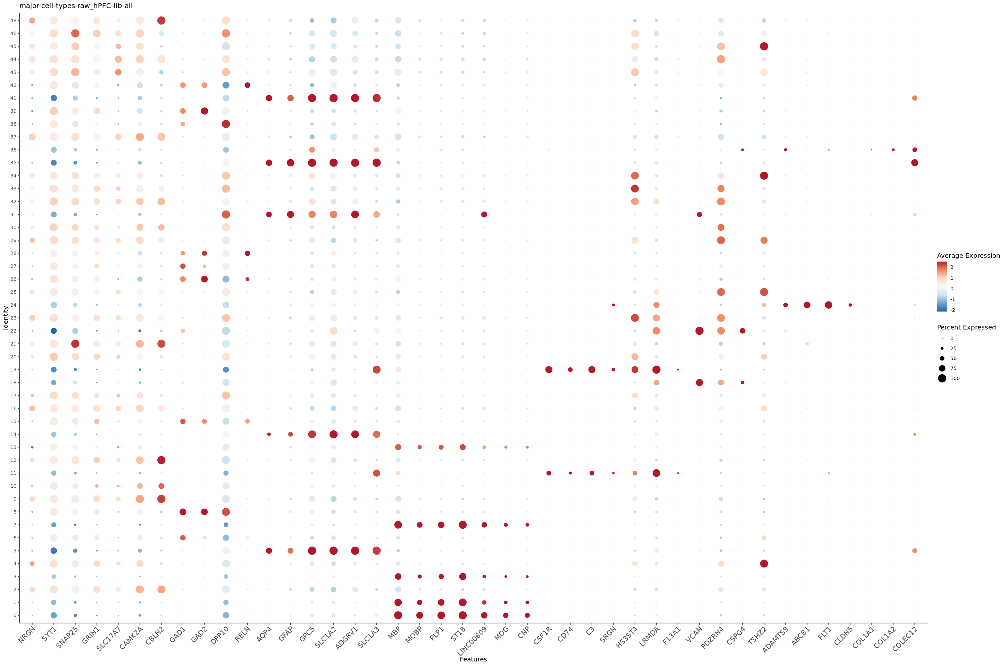

In [69]:
w = 24
h = 16
saved <- options(repr.plot.width=w, repr.plot.height=h)
plot_markers(obj.gage, genes.major, paste0("major-cell-types-raw_", lib_name), 
             width = w, height = h)
options(saved)

In [71]:
obj <- obj.gage
obj <- RenameIdents(object = obj, `0` = "Oligo")
obj <- RenameIdents(object = obj, `1` = "Oligo")
obj <- RenameIdents(object = obj, `2` = "Exc")
obj <- RenameIdents(object = obj, `3` = "Oligo")
obj <- RenameIdents(object = obj, `4` = "Exc")
obj <- RenameIdents(object = obj, `5` = "Astro")
obj <- RenameIdents(object = obj, `6` = "Inh")
obj <- RenameIdents(object = obj, `7` = "Oligo")
obj <- RenameIdents(object = obj, `8` = "Inh")
obj <- RenameIdents(object = obj, `9` = "Exc")
obj <- RenameIdents(object = obj, `10` = "Exc")
obj <- RenameIdents(object = obj, `11` = "Micro")
obj <- RenameIdents(object = obj, `12` = "Exc")
obj <- RenameIdents(object = obj, `13` = "Oligo")
obj <- RenameIdents(object = obj, `14` = "Astro")
obj <- RenameIdents(object = obj, `15` = "Inh")
obj <- RenameIdents(object = obj, `16` = "Exc")
obj <- RenameIdents(object = obj, `17` = "Exc")
obj <- RenameIdents(object = obj, `18` = "OPC")
obj <- RenameIdents(object = obj, `19` = "Micro")
obj <- RenameIdents(object = obj, `20` = "Exc")
obj <- RenameIdents(object = obj, `21` = "Exc")
obj <- RenameIdents(object = obj, `22` = "OPC")
obj <- RenameIdents(object = obj, `23` = "Exc")
obj <- RenameIdents(object = obj, `24` = "Endo")
obj <- RenameIdents(object = obj, `25` = "Exc")
obj <- RenameIdents(object = obj, `26` = "Inh")
obj <- RenameIdents(object = obj, `27` = "Inh")
obj <- RenameIdents(object = obj, `28` = "Inh")
obj <- RenameIdents(object = obj, `29` = "Exc")
obj <- RenameIdents(object = obj, `30` = "Exc")
obj <- RenameIdents(object = obj, `31` = "Astro")
obj <- RenameIdents(object = obj, `32` = "Exc")
obj <- RenameIdents(object = obj, `33` = "Exc")
obj <- RenameIdents(object = obj, `34` = "Exc")
obj <- RenameIdents(object = obj, `35` = "Astro")
obj <- RenameIdents(object = obj, `36` = "VLMC")
obj <- RenameIdents(object = obj, `37` = "Exc")
obj <- RenameIdents(object = obj, `38` = "Inh")
obj <- RenameIdents(object = obj, `39` = "Inh")
obj <- RenameIdents(object = obj, `40` = "Unk")
obj <- RenameIdents(object = obj, `41` = "Astro")
obj <- RenameIdents(object = obj, `42` = "Inh")
obj <- RenameIdents(object = obj, `43` = "Exc")
obj <- RenameIdents(object = obj, `44` = "Exc")
obj <- RenameIdents(object = obj, `45` = "Exc")
obj <- RenameIdents(object = obj, `46` = "Exc")
obj <- RenameIdents(object = obj, `47` = "Unk") # Mix of Micro and OPC, remove it
obj <- RenameIdents(object = obj, `48` = "Exc")
obj.gage@meta.data$major_cell_type <- Idents(obj)

In [73]:
Idents(obj.gage) <- obj.gage@meta.data$major_cell_type
obj.gage <- subset(obj.gage, idents = setdiff(levels(Idents(obj.gage)), "Unk"))

In [75]:
major_base_colors <- c(
    "Exc" = "turquoise4", 
    "Inh" = "deeppink2", 
    "Astro" = "orchid4",
    "Oligo" = "yellow3", 
    "Micro" = "steelblue4", 
    "OPC" = "springgreen4",
    "Endo" = "bisque4", 
    "VLMC" = "lightsalmon"
)

Warning message:
“The following requested variables were not found: OSP”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/markergene-dot-major-cell-types-annotated_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/markergene-dot-major-cell-types-annotated_hPFC-lib-all.pdf"


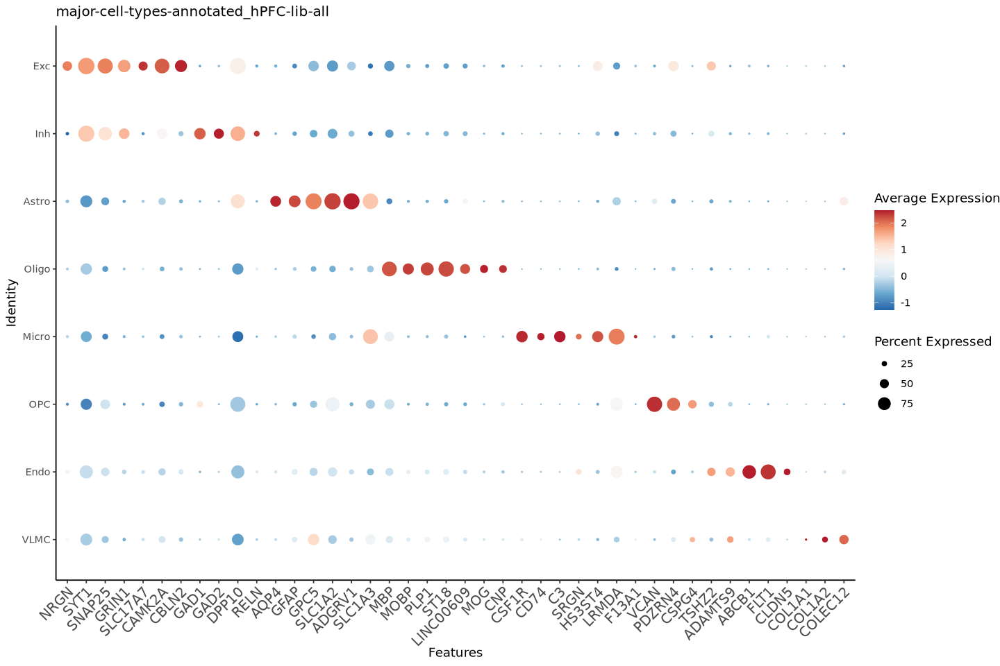

In [76]:
w <- 12
h <- 8
saved <- options(repr.plot.width=w, repr.plot.height=h)
sort_order <- names(major_base_colors)
plot_markers(obj.gage, genes.major, paste0("major-cell-types-annotated_", lib_name), sort_order=rev(sort_order), width=w, height=h)
options(saved)

### UMAP and Gene/UMI counts comparison

[1] "Exc"   "Inh"   "Astro" "VLMC"  "Endo"  "OPC"   "Micro" "Oligo"


[1] "Exc"   "Inh"   "Astro" "Oligo" "Micro" "OPC"   "Endo"  "VLMC" 
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/UMAP-major-celltype_RNA-Seurat_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/marker_genes/major_cell_type/meta-Seurat-major-cell-type_hPFC-lib-all.csv"


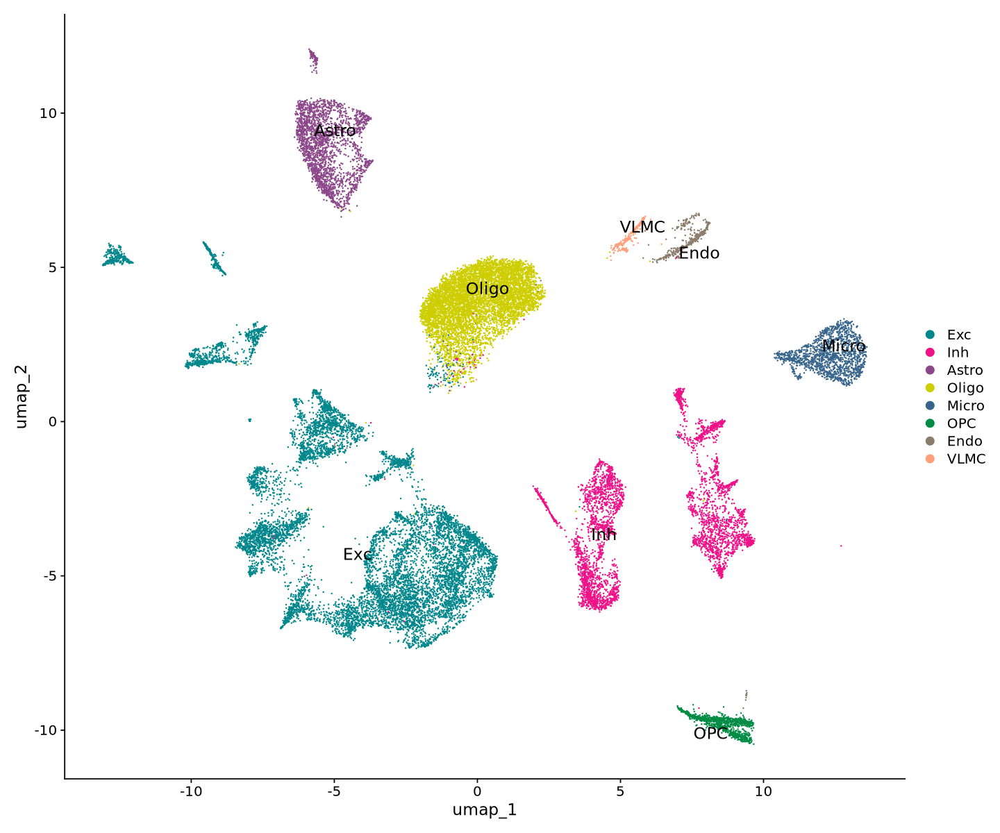

[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/coverage-major-cell-type_RNA-Seurat_hPFC-lib-all.png"


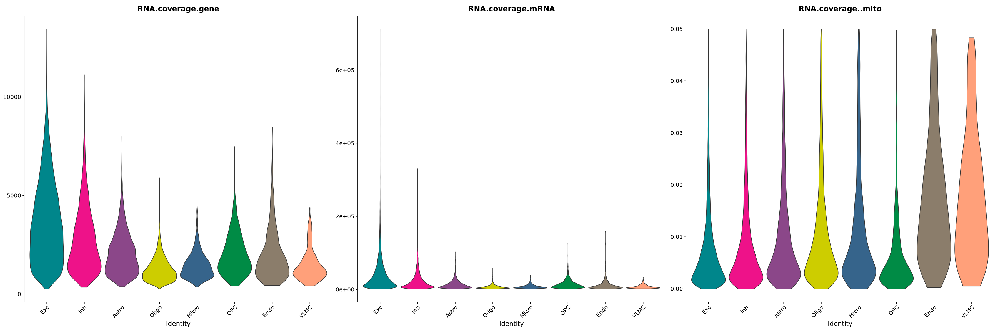

In [90]:
obj <- obj.gage
print(levels(Idents(obj)))
Idents(obj) <- factor(Idents(obj), levels = names(major_base_colors))
print(levels(Idents(obj)))

w = 12
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- DimPlot(obj, label=T, repel=T, label.size=5) + 
    scale_color_manual(values = major_base_colors)
print(p)
options(saved)

path2file = file.path(path2tmpfigdir, paste0("UMAP-major-celltype_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)

path2file = file.path(path2tmpresdir, paste0("meta-Seurat-major-cell-type_", lib_name, ".csv"))
print(path2file)
write.csv(data.frame(Idents(obj)), path2file)

w = 30
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)                      
p <- VlnPlot(obj, c('RNA.coverage.gene', 'RNA.coverage.mRNA', 'RNA.coverage..mito'),
             pt.size = 0, cols = major_base_colors)
print(p)                  
path2file = file.path(path2tmpfigdir, paste0("coverage-major-cell-type_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)
options(saved)   

### Cell number comparison

In [92]:
data <- obj.gage@meta.data %>%
  group_by(major_cell_type, condition) %>%
  summarise(count = n(), .groups = 'drop') %>%
  rename(cell_type = major_cell_type, group = condition)
data <- data %>%
  mutate(cell_type = factor(cell_type, levels = names(major_base_colors))) %>%
  arrange(cell_type, group)


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/major_cell_type/cell-number-comparison-major-cell-type_RNA-Seurat_hPFC-lib-all.png"


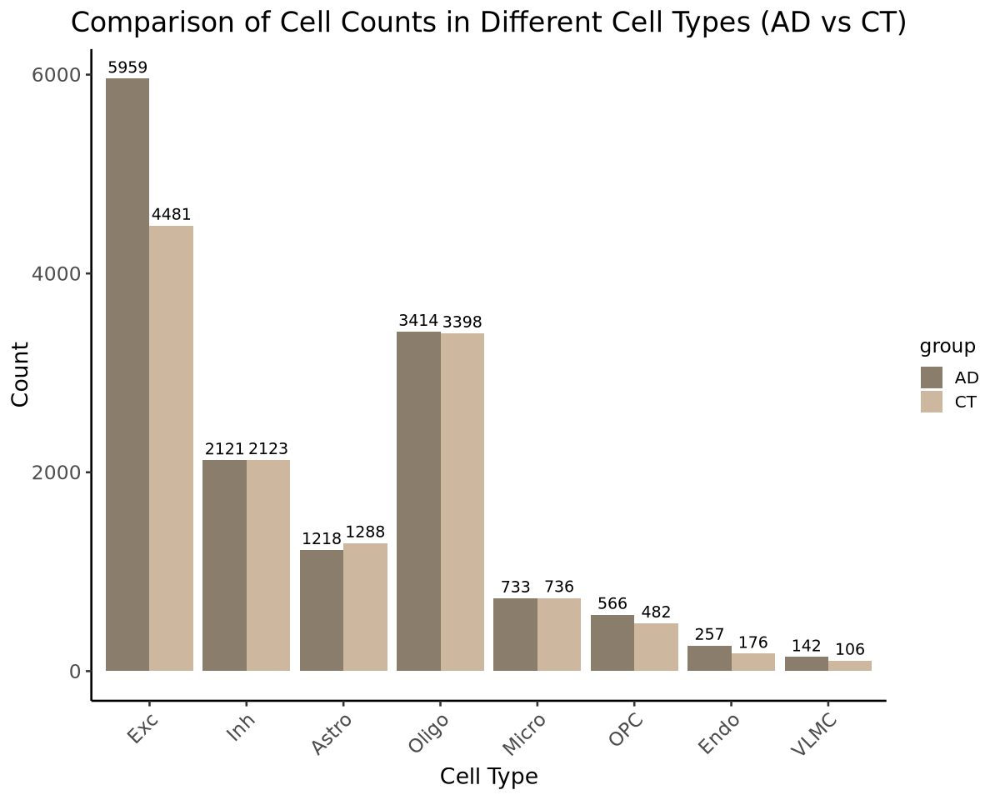

In [100]:
w = 10
h = 8

saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- ggplot(data, aes(x = cell_type, y = count, fill = group)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = count), 
            position = position_dodge(width = 0.9), 
            vjust = -0.5, size = 4) + # Adjust label text size here
  theme_classic(base_size = 16) + # Set base text size for the plot
  labs(
    title = "Comparison of Cell Counts in Different Cell Types (AD vs CT)", 
    x = "Cell Type", 
    y = "Count"
  ) +
  scale_fill_manual(values = c("bisque4", "bisque3")) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 14), # Increase x-axis text size
    axis.text.y = element_text(size = 14), # Increase y-axis text size
    axis.title.x = element_text(size = 16), # Increase x-axis label size
    axis.title.y = element_text(size = 16), # Increase y-axis label size
    legend.title = element_text(size = 14), # Increase legend title size
    legend.text = element_text(size = 12), # Increase legend text size
    plot.title = element_text(size = 20, hjust = 0.5) # Increase title size
  )

print(p)

path2file = file.path(path2tmpfigdir, paste0("cell-number-comparison-major-cell-type_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)
options(saved)  

## Annotate Sub Cell Types

In [104]:
path2tmpfigdir <- file.path(path2figdir, "marker_genes", "sub_cell_type")
path2tmpresdir <- file.path(path2resdir, "marker_genes", "sub_cell_type")
mkdirs(path2tmpfigdir)
mkdirs(path2tmpresdir)

Directory created: /home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type

Directory created: /home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/marker_genes/sub_cell_type



In [106]:
Idents(obj.gage) <- obj.gage@meta.data$raw.ident

### Load 10x markers

This may not be very accurate because some marker genes are actually shared among different cell types but not mentioned here. Will also call Allen Brain DLPFC markers.

In [108]:
data <- read.csv("/home/xinyuelu/AD-proj/marker_genes/Xenium_hBrain_v1_metadata.csv")
head(data)
unique_annotations <- unique(data$Annotation)
unique_annotations

,Genes,Ensembl_ID,Num_Probesets,Codewords,Annotation
,<chr>,<chr>,<int>,<int>,<chr>
1,ABCC9,ENSG00000069431,8,1,VLMC
2,ADAMTS12,ENSG00000151388,8,1,VLMC
3,ADAMTS16,ENSG00000145536,8,1,L4 IT
4,ADAMTS3,ENSG00000156140,8,1,L6 IT
5,ADRA1A,ENSG00000120907,8,1,Sncg
6,ADRA1B,ENSG00000170214,8,1,Sncg


[1] "VLMC"                        "L4 IT"                      
 [3] "L6 IT"                       "Sncg"                       
 [5] "Glioblastoma (TME)"          "Chandelier"                 
 [7] "Pax6"                        "Sst Chodl"                  
 [9] "Glioblastoma (Cancer cells)" "Microglia-PVM"              
[11] "Broad"                       "Astrocyte"                  
[13] "L5/6 NP"                     "OPC"                        
[15] "Pvalb"                       "Oligodendrocyte"            
[17] "Proliferation"               "L6 IT Car3"                 
[19] "Endothelial"                 "Sst"                        
[21] "L2/3 IT"                     "Lamp5"                      
[23] "Lamp5 Lhx6"                  "L6 CT"                      
[25] "L5 IT"                       "L6b"                        
[27] "L5 ET"                       "Vip"

In [112]:
subtype_markers_all <- list()
for (subtype in unique_annotations) {
  tmp <- data[data$Annotation == subtype, ]['Genes']
  subtype_markers_all[[subtype]] <- as.character(tmp$Genes)[0:min(10, length(tmp$Genes))]
}
subtype_markers_all

$VLMC
 [1] "ABCC9"    "ADAMTS12" "ANO3"     "CDH6"     "CEMIP"    "COL12A1" 
 [7] "CSPG4"    "DCN"      "FBLN1"    "IGFBP4"  

$`L4 IT`
[1] "ADAMTS16" "FSTL4"    "OTOGL"    "POU6F2"   "RORB"     "SLC17A6" 

$`L6 IT`
[1] "ADAMTS3" "C1QL3"   "SNTB2"  

$Sncg
[1] "ADRA1A" "ADRA1B" "LYPD6B" "PROX1"  "THSD7B"

$`Glioblastoma (TME)`
 [1] "AIF1"     "C1orf162" "CAPG"     "CCL5"     "CD14"     "CD163"   
 [7] "CD2"      "CD3G"     "CD4"      "CD48"    

$Chandelier
[1] "ALK"      "ANK1"     "CNTNAP3B" "LHX6"     "NPNT"     "PVALB"    "SDK1"    
[8] "TENM1"    "UNC5B"   

$Pax6
[1] "ANGPT1" "CCK"    "CDH4"   "CXCL14" "DDR2"   "PLD5"   "RELN"   "SFRP2" 
[9] "WIF1"  

$`Sst Chodl`
[1] "ANKRD18A" "CRHBP"    "NDST4"    "NXPH2"    "SST"      "TAC1"     "TACR1"   
[8] "TRPC6"   

$`Glioblastoma (Cancer cells)`
 [1] "ANXA1"    "B4GALNT1" "BCAN"     "CAV1"     "CHODL"    "EGFR"    
 [7] "ELOVL2"   "HES1"     "HILPDA"   "IDH1"    

$`Microglia-PVM`
 [1] "APOE"     "ARHGAP24" "CCL4"     "CD86"     "CTSH"     "FASLG"   
 [7] "HLA-DQA1" "IFITM3"   "ITGAM"    "ITGAX"   

$Broad
[1] "APP"

$Astrocyte
 [1] "AQP4"  "FGFR3" "GJA1"  "MEIS2" "NES"   "PAX6"  "RYR3"  "SOX9"  "SPON1"
[10] "TGFB2"

$`L5/6 NP`
[1] "ATP2C2" "CD36"   "CRYM"   "HTR2C"  "TPH2"   "TSHZ2"  "VWC2L" 

$OPC
 [1] "BRINP3" "CALCRL" "ITGA8"  "LRRK2"  "OLIG1"  "OLIG2"  "PDGFRA" "PTPRZ1"
 [9] "SEMA5A" "SOX10" 

$Pvalb
[1] "BTBD11" "GAD1"   "MEPE"   "MYO5B"  "RSPO2"  "SAMD5"  "SULF1" 

$Oligodendrocyte
 [1] "CAPN3"  "CDH1"   "CLDN11" "CNDP1"  "CNTN2"  "CTNNA3" "EFHD1"  "ERBB3" 
 [9] "ERMN"   "FGFR2" 

$Proliferation
[1] "CCNA1" "CCNB2" "CDK1"  "CENPF" "KIT"   "MKI67" "PCNA"  "TOP2A"

$`L6 IT Car3`
 [1] "CDH12"   "GAS2L3"  "NPY1R"   "NTNG2"   "NWD2"    "POSTN"   "RASGRP1"
 [8] "SLC26A4" "THEMIS"  "TRPC5"  

$Endothelial
[1] "CEMIP2"  "FLT1"    "NOTCH1"  "NRP1"    "PECAM1"  "RNF144B" "STAT3"  
[8] "THSD4"  

$Sst
[1] "COL25A1" "PLCH1"   "SYNPR"   "TRHDE"  

$`L2/3 IT`
[1] "CUX2"   "TESPA1" "ZBBX"  

$Lamp5
[1] "DNER"   "PTCHD4"

$`Lamp5 Lhx6`
[1] "EYA4"   "GAD2"   "LAMP5"  "LYPD6"  "MYO16"  "NTNG1"  "PDGFD"  "SPHKAP"

$`L6 CT`
[1] "FILIP1" "HS3ST2" "HS3ST4" "KCNH5" 

$`L5 IT`
[1] "HTR2A" "RXFP1"

$L6b
[1] "NPFFR2"  "ROS1"    "SLC17A7"

$`L5 ET`
[1] "PCSK1"  "RIT2"   "SLIT3"  "SNCG"   "SORCS1"

$Vip
[1] "SLC24A3" "VIP"

Warning message:
“The following requested variables were not found: HILPDA, BTBD11, CLDN11”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-raw-all_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-raw-all_hPFC-lib-all.pdf"


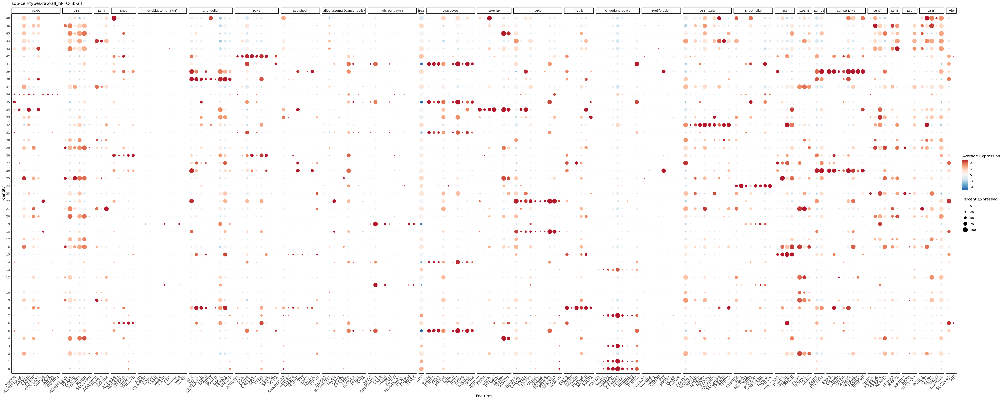

In [114]:
w = 40
h = 16
saved <- options(repr.plot.width=w, repr.plot.height=h)
plot_markers(obj.gage, subtype_markers_all, paste0("sub-cell-types-raw-all_", lib_name), width = w, height = h)
options(saved)

### Load Allen Brain sub cell type markers

In [101]:
path2data <- "/home/xinyuelu/AD-proj/marker_genes/ensembl"
path2res <- "/home/xinyuelu/AD-proj/marker_genes/gene_symbol"
path2genemapping <- "/home/xinyuelu/AD-proj/scripts_results/annotate_cells/gene_mapping.csv"

In [102]:
data <- read.csv(path2genemapping, row.names = 1)
gene_map <- setNames(data$gene_name, data$gene_id)

In [103]:
marker_files <- list.files(path2data, pattern = "\\.csv$", full.names = TRUE)
subtype_markers <- list()
unique_markers <- list()
for (file in marker_files) {
  
  data <- read.csv(file)
  
  if (!"names" %in% colnames(data)) {
    warning(paste("The file", file, "does not have a 'names' column. Skipping."))
    next
  }

  mapping_vector <- data$names
  top_30_markers <- mapping_vector[1:30]
  top_30_markers <- gene_map[top_30_markers]
  top_30_markers <- top_30_markers[!is.na(top_30_markers)]

  top_markers <- setdiff(top_30_markers, unlist(unique_markers))
  unique_markers<- append(unique_markers, list(top_markers))
  cell_type_name <- basename(file)
  cell_type_name <- strsplit(cell_type_name, "_")[[1]][1]
  subtype_markers[[cell_type_name]] <- head(top_markers, 10)
}

Warning message:
“The following requested variables were not found: CNTNAP4”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-raw_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-raw_hPFC-lib-all.pdf"


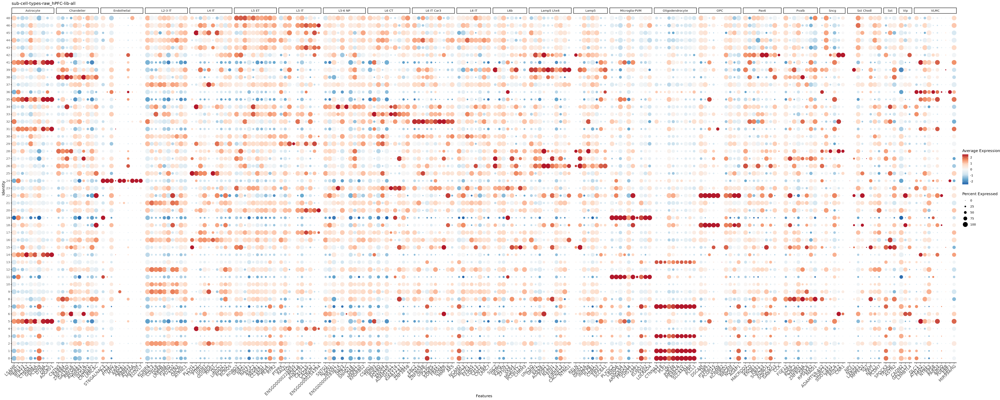

In [107]:
w = 40
h = 16
saved <- options(repr.plot.width=w, repr.plot.height=h)
plot_markers(obj.gage, subtype_markers, paste0("sub-cell-types-raw_", lib_name), width = w, height = h)
options(saved)

In [116]:
obj <- obj.gage
obj <- RenameIdents(object = obj, `0` = "Oligo") #ok
obj <- RenameIdents(object = obj, `1` = "Oligo") #ok
obj <- RenameIdents(object = obj, `2` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `3` = "Oligo") #ok
obj <- RenameIdents(object = obj, `4` = "Exc L4 IT") #ok
obj <- RenameIdents(object = obj, `5` = "Astro") #ok
obj <- RenameIdents(object = obj, `6` = "Inh Vip") #ok
obj <- RenameIdents(object = obj, `7` = "Oligo") #ok
obj <- RenameIdents(object = obj, `8` = "Inh Pvalb") #ok
obj <- RenameIdents(object = obj, `9` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `10` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `11` = "Micro") #ok
obj <- RenameIdents(object = obj, `12` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `13` = "Oligo") #ok
obj <- RenameIdents(object = obj, `14` = "Astro") #ok
obj <- RenameIdents(object = obj, `15` = "Inh Sst") #ok
obj <- RenameIdents(object = obj, `16` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `17` = "Exc L5 IT") #ok
obj <- RenameIdents(object = obj, `18` = "OPC") #ok
obj <- RenameIdents(object = obj, `19` = "Micro") #ok
obj <- RenameIdents(object = obj, `20` = "Exc L5 IT") #ok
obj <- RenameIdents(object = obj, `21` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `22` = "OPC") #ok
obj <- RenameIdents(object = obj, `23` = "Exc L6b") #ok
obj <- RenameIdents(object = obj, `24` = "Endo") #ok
obj <- RenameIdents(object = obj, `25` = "Exc L4 IT") #ok
obj <- RenameIdents(object = obj, `26` = "Inh Lamp5") #ok
obj <- RenameIdents(object = obj, `27` = "Inh Pvalb") #ok
obj <- RenameIdents(object = obj, `28` = "Inh Sncg") #ok
obj <- RenameIdents(object = obj, `29` = "Exc L4 IT") #ok
obj <- RenameIdents(object = obj, `30` = "Unk") #ok
obj <- RenameIdents(object = obj, `31` = "Astro") #ok
obj <- RenameIdents(object = obj, `32` = "Exc L6 IT Car3") #ok
obj <- RenameIdents(object = obj, `33` = "Exc L6 CT") #ok
obj <- RenameIdents(object = obj, `34` = "Exc L5/6 NP") #ok
obj <- RenameIdents(object = obj, `35` = "Astro") #ok
obj <- RenameIdents(object = obj, `36` = "VLMC") #ok
obj <- RenameIdents(object = obj, `37` = "Exc L2/3 IT") #ok
obj <- RenameIdents(object = obj, `38` = "Inh Chandelier") #ok
obj <- RenameIdents(object = obj, `39` = "Inh Lamp5") #ok
obj <- RenameIdents(object = obj, `41` = "Astro") #ok
obj <- RenameIdents(object = obj, `42` = "Inh PAX6") #ok
obj <- RenameIdents(object = obj, `43` = "Exc L5 IT") #ok
obj <- RenameIdents(object = obj, `44` = "Exc L6 IT") #ok
obj <- RenameIdents(object = obj, `45` = "Exc L4 IT") #ok
obj <- RenameIdents(object = obj, `46` = "Exc L5 IT") #ok
obj <- RenameIdents(object = obj, `48` = "Exc L5 ET") #ok
obj.gage@meta.data$sub_cell_type <- Idents(obj)

Depletion of L6 IT in AD?

In [117]:
Idents(obj.gage) <- obj.gage@meta.data$sub_cell_type
obj.gage <- subset(obj.gage, idents = setdiff(levels(Idents(obj.gage)), "Unk"))

In [120]:
sub_base_colors <- c(
    "Exc L2/3 IT" = "turquoise4", 
    "Exc L4 IT" = "lightskyblue3",
    "Exc L5 IT" = "lightgreen",
    "Exc L5 ET" = "cyan4",
    "Exc L5/6 NP" = "seagreen2",
    "Exc L6 IT" = "skyblue4",
    "Exc L6b" = "royalblue1",
    "Exc L6 CT" = "lightskyblue1",
    "Exc L6 IT Car3" = "cornflowerblue",
    "Inh Lamp5" = "deeppink4", 
    "Inh Sst" = "lightpink3",
    "Inh Sncg" = "firebrick4",
    "Inh Pvalb" = "tomato1",
    "Inh Vip" = "deeppink2",
    "Inh PAX6" = "lightpink1",
    "Inh Chandelier" = "plum1",
    "Oligo" = "yellow3", 
    "Astro" = "orchid4",
    "Micro" = "steelblue4", 
    "OPC" = "springgreen4",
    "Endo" = "bisque4", 
    "VLMC" = "palegreen3"
)

Warning message:
“The following requested variables were not found: HILPDA, BTBD11, CLDN11”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-all-annotated_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-all-annotated_hPFC-lib-all.pdf"


Warning message:
“The following requested variables were not found: CNTNAP4”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-annotated_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/markergene-dot-sub-cell-types-annotated_hPFC-lib-all.pdf"


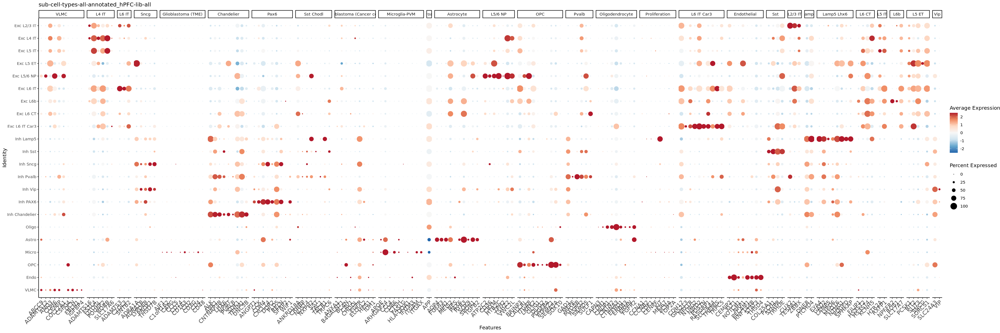

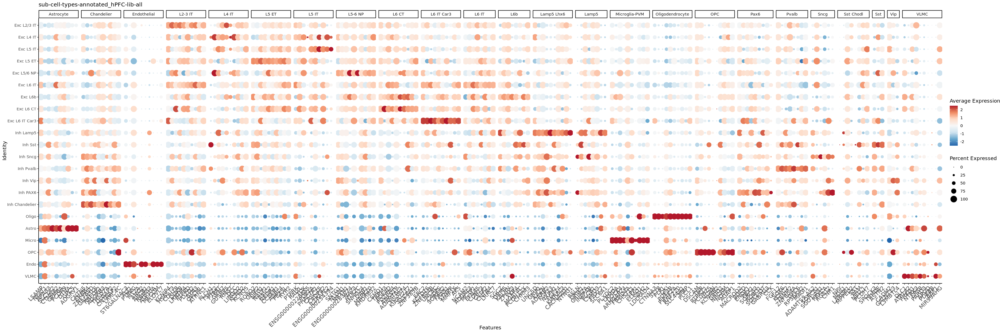

In [124]:
w <- 30
h <- 10
saved <- options(repr.plot.width=w, repr.plot.height=h)
sort_order <- names(sub_base_colors)
plot_markers(obj.gage, subtype_markers_all, paste0("sub-cell-types-all-annotated_", lib_name), sort_order=rev(sort_order), width=w, height=h)
plot_markers(obj.gage, subtype_markers, paste0("sub-cell-types-annotated_", lib_name), sort_order=rev(sort_order), width=w, height=h)
options(saved)

### UMAP and Gene/UMI counts comparison

 [1] "Exc L5 ET"      "Exc L5 IT"      "Exc L4 IT"      "Exc L6 IT"     
 [5] "Inh PAX6"       "Astro"          "Inh Lamp5"      "Inh Chandelier"
 [9] "Exc L2/3 IT"    "VLMC"           "Exc L5/6 NP"    "Exc L6 CT"     
[13] "Exc L6 IT Car3" "Inh Sncg"       "Inh Pvalb"      "Endo"          
[17] "Exc L6b"        "OPC"            "Micro"          "Inh Sst"       
[21] "Oligo"          "Inh Vip"       
 [1] "Exc L2/3 IT"    "Exc L4 IT"      "Exc L5 IT"      "Exc L5 ET"     
 [5] "Exc L5/6 NP"    "Exc L6 IT"      "Exc L6b"        "Exc L6 CT"     
 [9] "Exc L6 IT Car3" "Inh Lamp5"      "Inh Sst"        "Inh Sncg"      
[13] "Inh Pvalb"      "Inh Vip"        "Inh PAX6"       "Inh Chandelier"
[17] "Oligo"          "Astro"          "Micro"          "OPC"           
[21] "Endo"           "VLMC"          
[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/UMAP-sub-celltype_RNA-Seurat_hPFC-lib-all.png"
[1] "/home/xinyuelu/AD-proj/results/results-annot

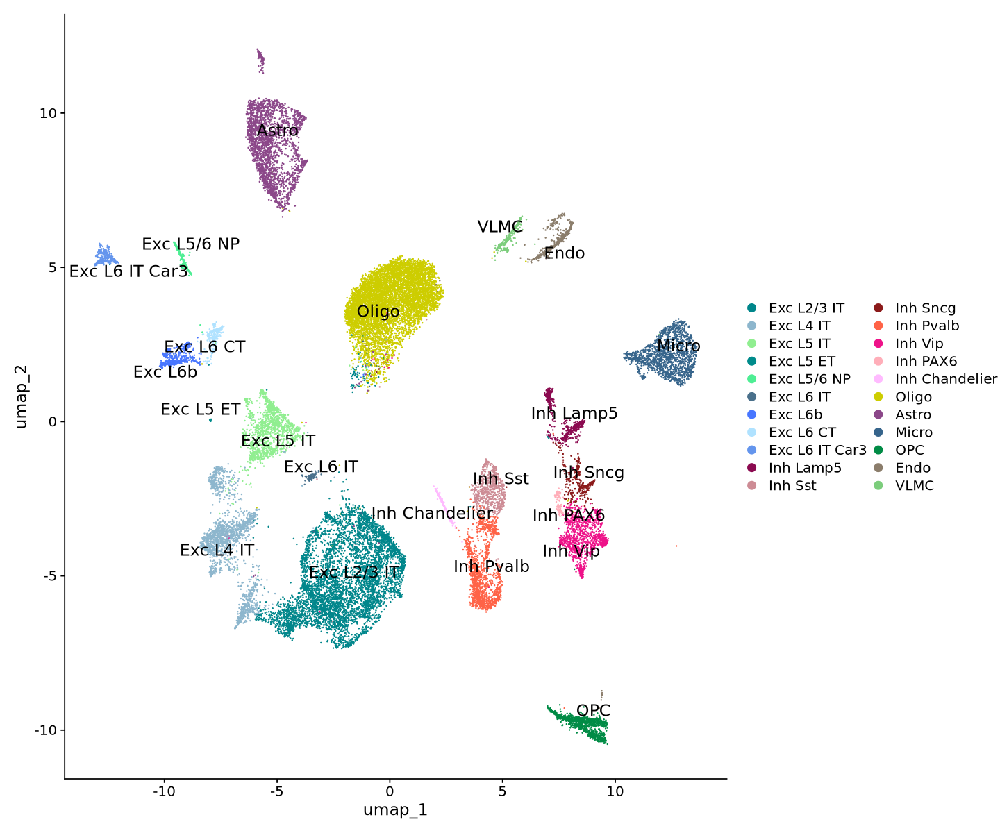

[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/coverage-sub-cell-type_RNA-Seurat_hPFC-lib-all.png"


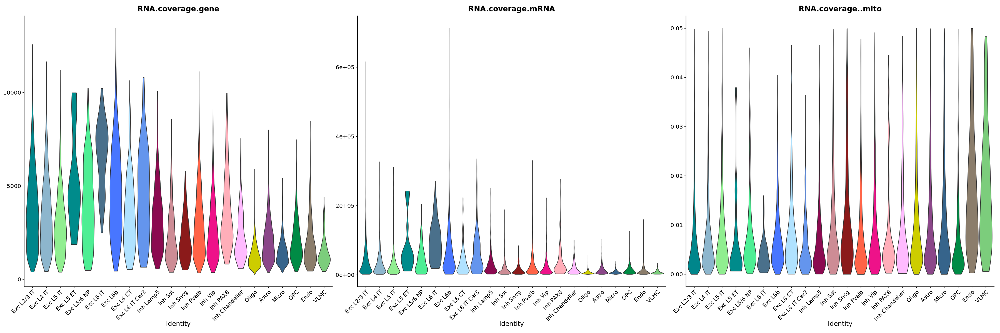

In [125]:
obj <- obj.gage
print(levels(Idents(obj)))
Idents(obj) <- factor(Idents(obj), levels = names(sub_base_colors))
print(levels(Idents(obj)))

w = 12
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- DimPlot(obj, label=T, repel=T, label.size=5) + 
    scale_color_manual(values = sub_base_colors)
print(p)
options(saved)

path2file = file.path(path2tmpfigdir, paste0("UMAP-sub-celltype_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)

path2file = file.path(path2tmpresdir, paste0("meta-Seurat-sub-cell-type_", lib_name, ".csv"))
print(path2file)
write.csv(data.frame(Idents(obj)), path2file)

w = 30
h = 10
saved <- options(repr.plot.width=w, repr.plot.height=h)                      
p <- VlnPlot(obj, c('RNA.coverage.gene', 'RNA.coverage.mRNA', 'RNA.coverage..mito'),
             pt.size = 0, cols = sub_base_colors)
print(p)                  
path2file = file.path(path2tmpfigdir, paste0("coverage-sub-cell-type_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)
options(saved)  

### Cell number comparison

In [129]:
data <- obj.gage@meta.data %>%
  group_by(sub_cell_type, condition) %>%
  summarise(count = n(), .groups = 'drop') %>%
  rename(cell_type = sub_cell_type, group = condition)
data <- data %>%
  mutate(cell_type = factor(cell_type, levels = names(sub_base_colors))) %>%
  arrange(cell_type, group)

[1] "/home/xinyuelu/AD-proj/results/figures-annotate-hPFC/annotation/marker_genes/sub_cell_type/cell-number-comparison-sub-cell-type_RNA-Seurat_hPFC-lib-all.png"


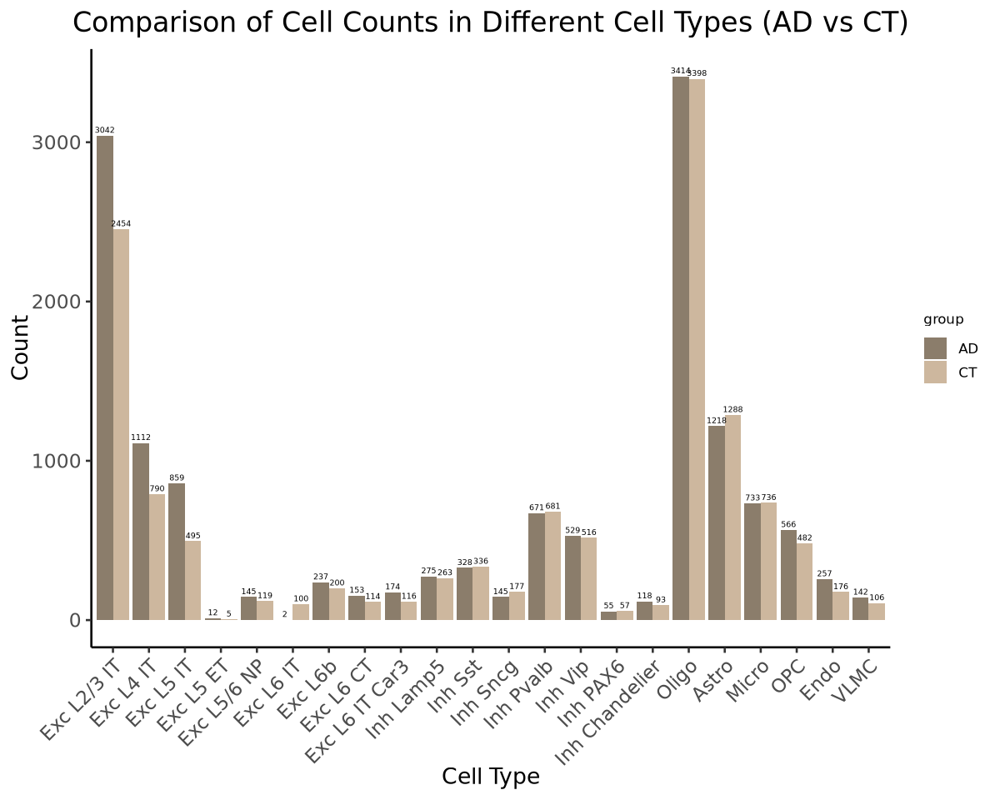

In [134]:
w = 10
h = 8

saved <- options(repr.plot.width=w, repr.plot.height=h)
p <- ggplot(data, aes(x = cell_type, y = count, fill = group)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = count), 
            position = position_dodge(width = 0.9), 
            vjust = -0.5, size = 2) + # Adjust label text size here
  theme_classic(base_size = 16) + # Set base text size for the plot
  labs(
    title = "Comparison of Cell Counts in Different Cell Types (AD vs CT)", 
    x = "Cell Type", 
    y = "Count"
  ) +
  scale_fill_manual(values = c("bisque4", "bisque3")) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 14), # Increase x-axis text size
    axis.text.y = element_text(size = 14), # Increase y-axis text size
    axis.title.x = element_text(size = 16), # Increase x-axis label size
    axis.title.y = element_text(size = 16), # Increase y-axis label size
    legend.title = element_text(size = 10), # Increase legend title size
    legend.text = element_text(size = 10), # Increase legend text size
    plot.title = element_text(size = 20, hjust = 0.5) # Increase title size
  )

print(p)

path2file = file.path(path2tmpfigdir, paste0("cell-number-comparison-sub-cell-type_RNA-Seurat_", lib_name, ".png"))
print(path2file)
ggsave(path2file, p, width=w, height=h)
options(saved) 

## Save final results

In [128]:
saveRDS(obj.gage, file.path(path2resdir, "AD_rna_annotated_unfiltered.rds"))

In [135]:
selected_meta <- obj.gage@meta.data[, c("raw.ident", "major_cell_type", "sub_cell_type", "condition", "sex", "sample_id", "DNA.long.short")]
head(selected_meta)
path2file = file.path(path2resdir, paste0("meta-Seurat-all_", lib_name, ".csv"))
print(path2file)
write.csv(selected_meta, path2file)

,raw.ident,major_cell_type,sub_cell_type,condition,sex,sample_id,DNA.long.short
,<fct>,<fct>,<fct>,<chr>,<chr>,<int>,<dbl>
"hPFC-lib-1_A1,A7",19,Micro,Micro,CT,Female,21272396,0.2464653
"hPFC-lib-1_A1,C5",18,OPC,OPC,AD,Male,66754397,0.2391536
"hPFC-lib-1_A1,C8",7,Oligo,Oligo,AD,Male,66754397,0.2444619
"hPFC-lib-1_A1,C12",15,Inh,Inh Sst,AD,Male,66754397,0.1723530
"hPFC-lib-1_A1,D2",0,Oligo,Oligo,AD,Male,66754397,0.3029033
"hPFC-lib-1_A1,E1",22,OPC,OPC,CT,Male,77239958,0.2260015


[1] "/home/xinyuelu/AD-proj/results/results-annotate-hPFC/annotation/meta-Seurat-all_hPFC-lib-all.csv"
